In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!cd /content/drive/MyDrive/LungColon

/bin/bash: line 1: cd: /content/drive/MyDrive/LungColon: No such file or directory


In [3]:
# import system libs
import os
import time
import shutil
import pathlib
import itertools
from PIL import Image

# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


In [4]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
cur_path = '/content/drive/MyDrive/lung_canser/'

In [6]:
os.chdir('/content/drive/MyDrive/lung_canser/')

In [10]:
!unzip /content/drive/MyDrive/lung_canser/lung_colon_image_set.zip

Streaming output truncated to the last 5000 lines.
  inflating: lung_image_sets/lung_scc/lungscc1.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc10.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc100.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1000.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1001.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1002.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1003.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1004.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1005.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1006.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1007.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1008.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1009.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc101.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1010.jpeg  
  inflating: lung_image_sets/lung_scc/lungscc1011.jpeg  
  inflating: lung_image_sets/lung_scc/lungsc

In [11]:
import os
import pandas as pd

data_dir = '/content/drive/MyDrive/lung_canser'
filepaths = []
labels = []

folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)

    # تحقق مما إذا كان المسار هو مجلد فقط
    if os.path.isdir(foldpath):
        flist = os.listdir(foldpath)

        for f in flist:
            f_path = os.path.join(foldpath, f)

            # تحقق مما إذا كان المسار هو مجلد فقط
            if os.path.isdir(f_path):
                filelist = os.listdir(f_path)

                for file in filelist:
                    fpath = os.path.join(f_path, file)
                    filepaths.append(fpath)

                    if f == 'colon_aca':
                        labels.append('Colon Adenocarcinoma')

                    elif f == 'colon_n':
                        labels.append('Colon Benign Tissue')

                    elif f == 'lung_aca':
                        labels.append('Lung Adenocarcinoma')

                    elif f == 'lung_n':
                        labels.append('Lung Benign Tissue')

                    elif f == 'lung_scc':
                        labels.append('Lung Squamous Cell Carcinoma')

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name='filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis=1)

# Display the dataframe
print(df)


                                               filepaths  \
0      /content/drive/MyDrive/lung_canser/colon_image...   
1      /content/drive/MyDrive/lung_canser/colon_image...   
2      /content/drive/MyDrive/lung_canser/colon_image...   
3      /content/drive/MyDrive/lung_canser/colon_image...   
4      /content/drive/MyDrive/lung_canser/colon_image...   
...                                                  ...   
24995  /content/drive/MyDrive/lung_canser/lung_image_...   
24996  /content/drive/MyDrive/lung_canser/lung_image_...   
24997  /content/drive/MyDrive/lung_canser/lung_image_...   
24998  /content/drive/MyDrive/lung_canser/lung_image_...   
24999  /content/drive/MyDrive/lung_canser/lung_image_...   

                             labels  
0              Colon Adenocarcinoma  
1              Colon Adenocarcinoma  
2              Colon Adenocarcinoma  
3              Colon Adenocarcinoma  
4              Colon Adenocarcinoma  
...                             ...  
24995  Lung S

In [12]:
strat = df['labels']
train_df, dummy_df = train_test_split(df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= strat)

# valid and test dataframe
strat = dummy_df['labels']
valid_df, test_df = train_test_split(dummy_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= strat)

In [13]:
batch_size = 64
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()

train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                        color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)

Found 20000 validated image filenames belonging to 5 classes.
Found 2500 validated image filenames belonging to 5 classes.
Found 2500 validated image filenames belonging to 5 classes.


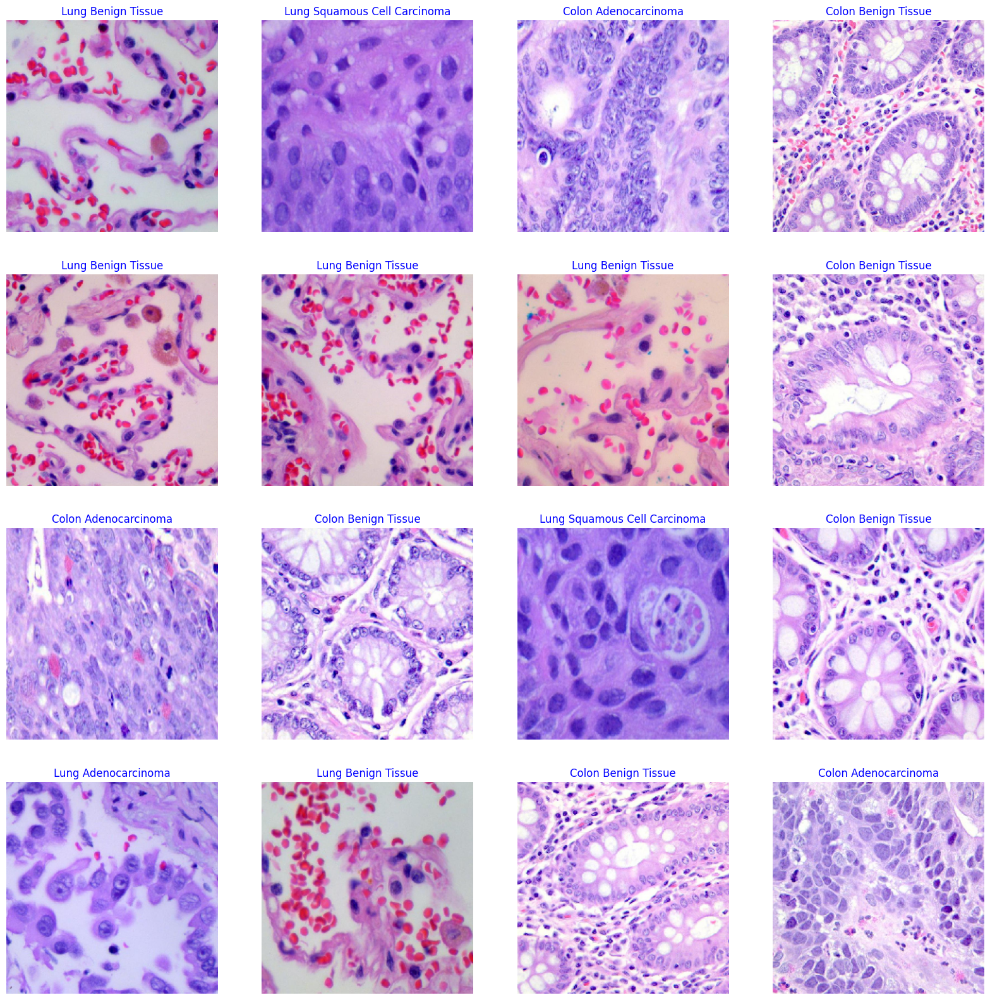

In [14]:
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.show()

In [15]:
# Create Model Structure
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys()))

model = Sequential([
    Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu", input_shape= img_shape),
    Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(256,activation = "relu"),
    Dense(64,activation = "relu"),
    Dense(class_count, activation = "softmax")
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

In [16]:
# Import the necessary libraries for the new features
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, recall_score
import seaborn as sns

# 1. Add EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
epochs = 6
# Modify the model training to include the EarlyStopping callback
history = model.fit(
    x= train_gen,
    epochs= epochs,
    verbose= 1,
    validation_data= test_gen,
    validation_steps= None,
    shuffle= False,
    callbacks=[early_stopping]  # Include the early stopping callback here
)

Epoch 1/6
313/313 ━━━━━━━━━━━━━━━━━━━━ 531s 1s/step - accuracy: 0.4045 - loss: 8.7798 - val_accuracy: 0.8312 - val_loss: 0.3773
Epoch 2/6
313/313 ━━━━━━━━━━━━━━━━━━━━ 333s 1s/step - accuracy: 0.8395 - loss: 0.3828 - val_accuracy: 0.9068 - val_loss: 0.2377
Epoch 3/6
313/313 ━━━━━━━━━━━━━━━━━━━━ 334s 1s/step - accuracy: 0.9071 - loss: 0.2360 - val_accuracy: 0.8772 - val_loss: 0.3079
Epoch 4/6
313/313 ━━━━━━━━━━━━━━━━━━━━ 340s 1s/step - accuracy: 0.9329 - loss: 0.1751 - val_accuracy: 0.9408 - val_loss: 0.1474
Epoch 5/6
313/313 ━━━━━━━━━━━━━━━━━━━━ 336s 1s/step - accuracy: 0.9516 - loss: 0.1304 - val_accuracy: 0.9620 - val_loss: 0.1013
Epoch 6/6
313/313 ━━━━━━━━━━━━━━━━━━━━ 336s 1s/step - accuracy: 0.9584 - loss: 0.1063 - val_accuracy: 0.9572 - val_loss: 0.1148


In [23]:
model.save("lung_canser.h5")

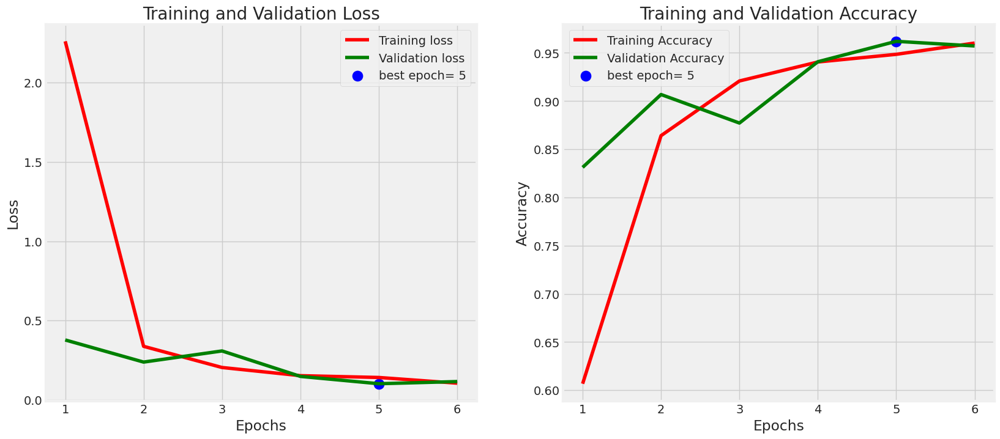

In [17]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [18]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Valid Loss: ", valid_score[0])
print("Valid Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

50/50 ━━━━━━━━━━━━━━━━━━━━ 29s 566ms/step - accuracy: 0.9735 - loss: 0.0705
50/50 ━━━━━━━━━━━━━━━━━━━━ 23s 450ms/step - accuracy: 0.9661 - loss: 0.0899
50/50 ━━━━━━━━━━━━━━━━━━━━ 22s 433ms/step - accuracy: 0.9616 - loss: 0.1025
Train Loss:  0.07045051455497742
Train Accuracy:  0.9740625023841858
--------------------
Valid Loss:  0.09352629631757736
Valid Accuracy:  0.9628000259399414
--------------------
Test Loss:  0.10126984119415283
Test Accuracy:  0.9620000123977661


40/40 ━━━━━━━━━━━━━━━━━━━━ 26s 632ms/step


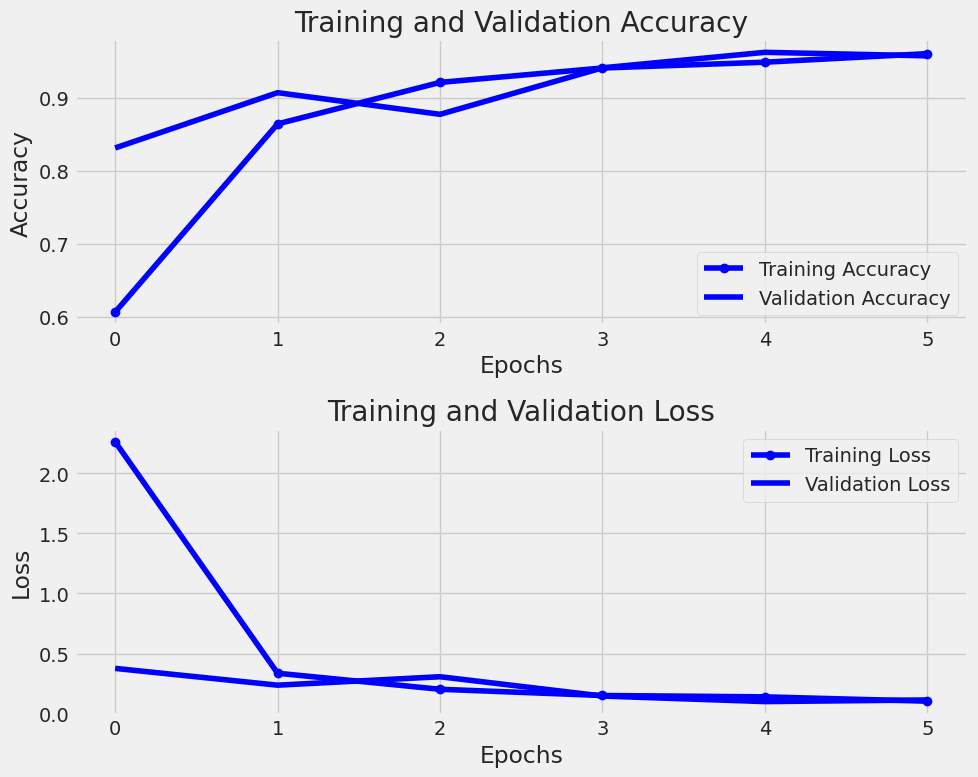

F1 Score: 0.9618
Recall: 0.9620


In [28]:
def plot_metrics(history, test_gen, model):
    import numpy as np
    from sklearn.metrics import f1_score, recall_score
    import matplotlib.pyplot as plt

    tr_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    tr_loss = history.history['loss']
    val_loss = history.history['val_loss']

    preds = model.predict(test_gen)
    y_pred = np.argmax(preds, axis=1)
    y_true = test_gen.classes

    f1 = f1_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')

    plt.figure(figsize=(10, 8))

    plt.subplot(2, 1, 1)
    plt.plot(tr_acc, 'bo-', label='Training Accuracy')
    plt.plot(val_acc, 'b-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(tr_loss, 'bo-', label='Training Loss')
    plt.plot(val_loss, 'b-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"F1 Score: {f1:.4f}")
    print(f"Recall: {recall:.4f}")

plot_metrics(history, test_gen, model)


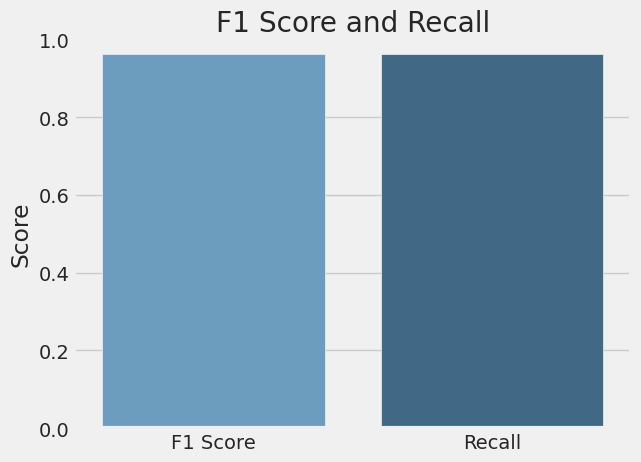

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

# نفترض أن F1 و Recall محسوبان بالفعل
f1 = 0.9618
recall = 0.9620

# أسماء القيم
metrics = ['F1 Score', 'Recall']
# القيم المقابلة
values = [f1, recall]

# إنشاء مخطط الأعمدة
sns.barplot(x=metrics, y=values, palette='Blues_d')
plt.ylim(0, 1)  # تحديد نطاق القيم من 0 إلى 1
plt.title('F1 Score and Recall')
plt.ylabel('Score')
plt.show()


40/40 ━━━━━━━━━━━━━━━━━━━━ 27s 671ms/step


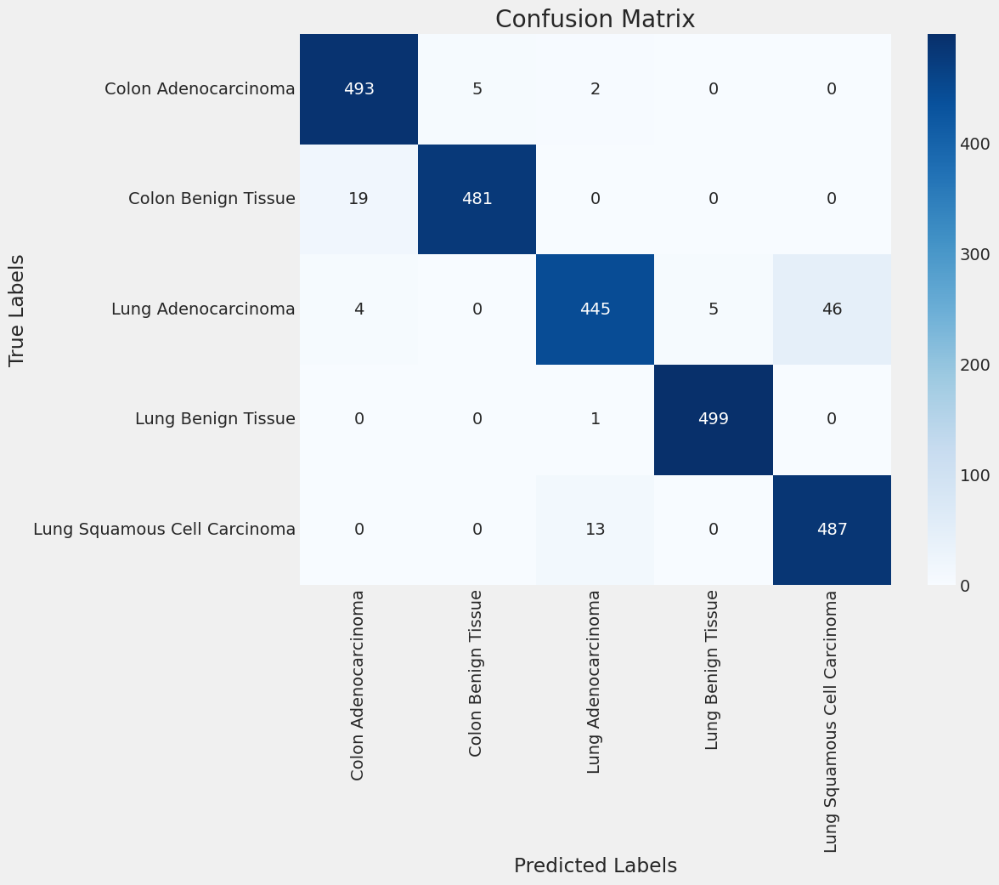

In [31]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# توقع التصنيفات باستخدام النموذج
preds = model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)
y_true = test_gen.classes

# حساب مصفوفة التشوش
cm = confusion_matrix(y_true, y_pred)

# الحصول على أسماء الفئات (التسميات)
class_names = list(test_gen.class_indices.keys())

# رسم مصفوفة التشوش
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 502ms/step


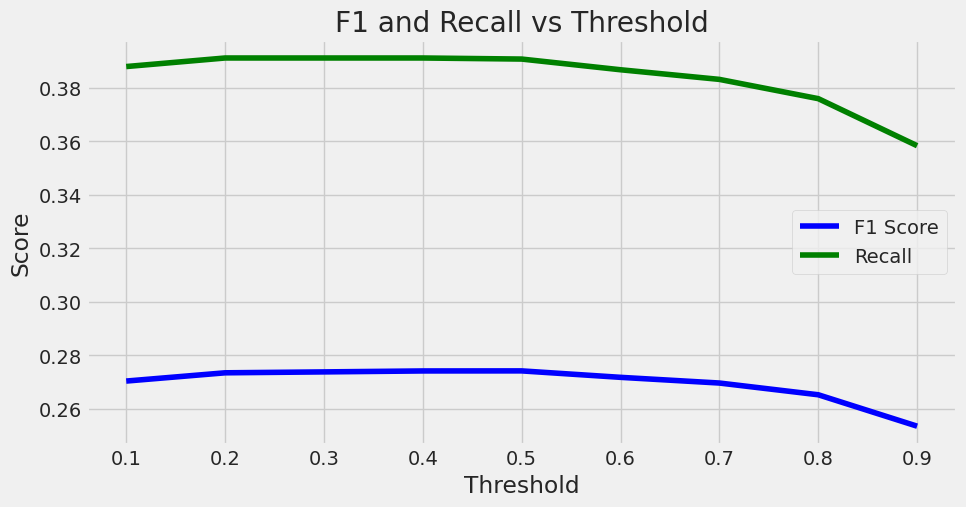

In [21]:
# 5. Threshold with F1 and Recall Graph
def plot_f1_recall_vs_threshold(model, test_gen):
    y_true = test_gen.classes
    preds = model.predict(test_gen)
    thresholds = np.arange(0.1, 1, 0.1)

    f1_scores = []
    recall_scores = []

    for threshold in thresholds:
        y_pred = (preds[:, 1] > threshold).astype(int)
        f1_scores.append(f1_score(y_true, y_pred, average='weighted'))
        recall_scores.append(recall_score(y_true, y_pred, average='weighted'))

    plt.figure(figsize=(10, 5))
    plt.plot(thresholds, f1_scores, 'b', label='F1 Score')
    plt.plot(thresholds, recall_scores, 'g', label='Recall')
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('F1 and Recall vs Threshold')
    plt.legend()
    plt.show()

plot_f1_recall_vs_threshold(model, test_gen)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


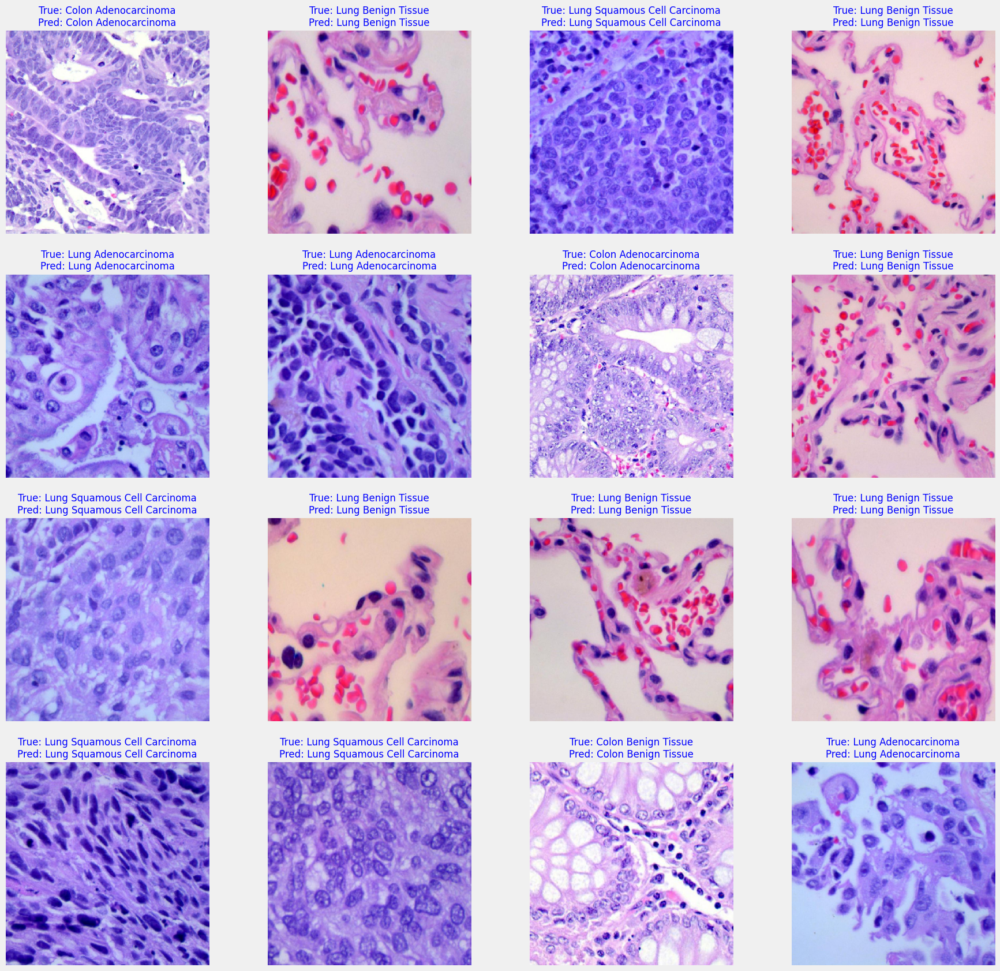

In [27]:
# 2. Add Photo with Label During Testing
def display_predictions(test_gen, model, classes):
    images, labels = next(test_gen)
    preds = model.predict(images)
    pred_labels = np.argmax(preds, axis=1)
    true_labels = np.argmax(labels, axis=1)

    plt.figure(figsize=(20, 20))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        plt.axis('off')

        true_class_name = classes[true_labels[i]]
        pred_class_name = classes[pred_labels[i]]

        title_color = 'blue' if true_class_name == pred_class_name else 'red'
        plt.title(f"True: {true_class_name}\nPred: {pred_class_name}", color=title_color, fontsize=12)

    plt.show()

display_predictions(test_gen, model, classes)